## Test action chunk reconstruction using LDS
Test how good we can reconstruct the action chunk from the tokenized action.

Concat will make different trajs append to each other, which is not what we want.

Need to figure out:
1. what is the error that we can accept?
2. why they use BPE? How good is the tokenization?

Data table (data is fake at the moment):
| Method Name | Reconstruction Error | Parameter Count | Comment |
|-------------|----------------------|-----------------|---------|
| original A    | 0.05                 | 1000            | Good performance with low error |
| Eigen Decomposition    | 0.10                 | 1500            | Higher error but more parameters |
| Sparse A    | 0.07                 | 1200            | Balanced approach |


<KeysViewHDF5 ['demo_0', 'demo_1', 'demo_10', 'demo_100', 'demo_101', 'demo_102', 'demo_103', 'demo_104', 'demo_105', 'demo_106', 'demo_107', 'demo_108', 'demo_109', 'demo_11', 'demo_110', 'demo_111', 'demo_112', 'demo_113', 'demo_114', 'demo_115', 'demo_116', 'demo_117', 'demo_118', 'demo_119', 'demo_12', 'demo_120', 'demo_121', 'demo_122', 'demo_123', 'demo_124', 'demo_125', 'demo_126', 'demo_127', 'demo_128', 'demo_129', 'demo_13', 'demo_130', 'demo_131', 'demo_132', 'demo_133', 'demo_134', 'demo_135', 'demo_136', 'demo_137', 'demo_138', 'demo_139', 'demo_14', 'demo_140', 'demo_141', 'demo_142', 'demo_143', 'demo_144', 'demo_145', 'demo_146', 'demo_147', 'demo_148', 'demo_149', 'demo_15', 'demo_150', 'demo_151', 'demo_152', 'demo_153', 'demo_154', 'demo_155', 'demo_156', 'demo_157', 'demo_158', 'demo_159', 'demo_16', 'demo_160', 'demo_161', 'demo_162', 'demo_163', 'demo_164', 'demo_165', 'demo_166', 'demo_167', 'demo_168', 'demo_169', 'demo_17', 'demo_170', 'demo_171', 'demo_172', '

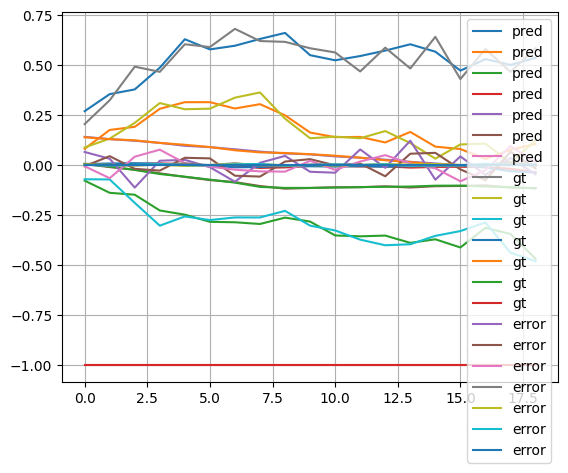

Approximated A matrix:
[[-0.09268992  0.3021844  -0.27635267 -0.00336273 -0.00422509 -0.02827098
   0.        ]
 [ 0.70941791  0.37458364  0.37369868 -0.01565974  0.02160663 -0.03652825
   0.        ]
 [-0.54139093 -0.39035417  0.565537   -0.00290025  0.04681036 -0.00284005
   0.        ]
 [-0.53249381 -2.31175673  1.75829259  1.06408728 -0.07955026  0.42291573
   0.        ]
 [-0.06677518  1.31711508 -0.32721682  0.14922035  0.788538    0.08603848
   0.        ]
 [-0.28813289  1.44005346  0.02055174 -0.14556666  0.07566669  0.64112896
   0.        ]
 [-0.28449895  0.12689035  0.03732047  0.01936953 -0.02227699  0.01921298
   1.        ]]
A_sparse:
<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 43 stored elements and shape (7, 7)>
  Coords	Values
  (0, 0)	-0.09268991818769037
  (0, 1)	0.3021843970396405
  (0, 2)	-0.27635267154111354
  (0, 3)	-0.003362734592042445
  (0, 4)	-0.0042250934410583705
  (0, 5)	-0.028270982472747633
  (1, 0)	0.7094179071833934
  (1, 1)	0.3745836

In [3]:
# import seaborn as sns
import h5py
import matplotlib.pyplot as plt
import numpy as np
from scipy import sparse


def sparsify_matrix(A, threshold=1e-6):
    # Zero out small elements
    A[np.abs(A) < threshold] = 0
    # Convert to sparse format
    A_sparse = sparse.csr_matrix(A)
    return A_sparse


def denormalize_action_mean_std(action_norm, mean, std):
    # action: [t, horizon]
    return action_norm * std + mean


def normalize_action_percentile(actions):
    # following  FAST paper to normalize the action with 1%-99% percentile
    # input: [t, action_dim]
    # output: [t, action_dim], min, max
    min_val = np.percentile(actions, 1, axis=0)
    max_val = np.percentile(actions, 99, axis=0)
    return (actions - min_val) / (max_val - min_val), min_val, max_val


def denormalize_action_percentile(action_norm, min_val, max_val):
    # input: [t, action_dim]
    # output: [t, action_dim]
    return action_norm * (max_val - min_val) + min_val


## Read state and action data
state_data = []
action_data = []
with h5py.File("/srv/rl2-lab/flash7/zhenyang/data/robomimic-sim/low_dim_v141.hdf5", "r") as f:
    f = f["data"]
    print(f.keys())
    print(f["demo_0"].keys())
    for demo in f.keys():
        state_data.append(f[demo]["states"][:])
        action_data.append(f[demo]["actions"][:])

state_data_array = np.concatenate(state_data, axis=0)
action_data_array = np.concatenate(action_data, axis=0)
xyz_data = action_data_array[:, :3]
# Calculate mean and variance
xyz_mean = np.mean(xyz_data, axis=0)
xyz_var = np.var(xyz_data, axis=0)

print(state_data_array.shape)
print(action_data_array.shape)
print(f"Mean of xyz: {xyz_mean}")
print(f"Variance of xyz: {xyz_var}")


###########################
### Normalize the data old ###
# state_mean = np.mean(state_data_array, axis=0)
# state_std = np.std(state_data_array, axis=0)
# state_data_array = (state_data_array - state_mean) / state_std

# action_mean = np.mean(action_data_array, axis=0)
# action_std = np.std(action_data_array, axis=0)
# action_data_norm = (action_data_array - action_mean) / action_std
###########################

###########################
### Normalize data with percentile ###
action_norm, action_min, action_max = normalize_action_percentile(action_data_array)
print(
    f"action_norm shape: {action_norm.shape}, action_min shape: {action_min.shape}, action_max shape: {action_max.shape}"
)
test_action_norm = action_norm[10:30, :]

###########################
# assumption1: actions at each dim are dependent (LDS)
# but this assumption is not good for other embodiment (e.g. gripper shouldn't affect eef_pose), and fix the dim we can explore

# Using least squares to approximate the A matrix of test_seq which is a linear system trajectory
# Assuming the linear system is of the form: x_{t+1} = A * x_t
# We need to solve for A using least squares
test_seq = action_data[0][:20, :]  # 20x7 1s data

# Prepare the data matrices
X = test_seq[:-1]  # x_t
Y = test_seq[1:]  # x_{t+1}

# Solve for A using least squares: A = (X^T * X)^(-1) * X^T * Y
A, residuals, rank, s = np.linalg.lstsq(X, Y, rcond=None)
A_sparse = sparsify_matrix(A)
# reconstruction_error = np.sum(residuals)
# print("Reconstruction error:", reconstruction_error)

X_pred = np.dot(X, A)
print(f"reconstruction error: {np.mean(np.abs(X_pred - Y), axis=0)}")
plt.plot(X_pred, label="pred")
plt.plot(Y, label="gt")
plt.plot(X_pred - Y, label="error")
plt.legend()
plt.grid()
plt.show()

print("Approximated A matrix:")
# np.set_printoptions(precision=3)
print(A)
print("A_sparse:")
print(A_sparse)

# Perform Eigen Decomposition for matrix A
# eigenvalues, eigenvectors = np.linalg.eig(A)

# print("Eigenvalues:")
# print(eigenvalues)
# print("Eigenvectors:")
# print(eigenvectors)

## Test of pi0 FAST tokenizer
1. Test the input output error side by side with LDS-Tokenizer
2. Test if using shorter tokens can still recover meaningful signal

/srv/rl2-lab/flash7/zhenyang/miniconda3/envs/openpi/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/srv/rl2-lab/flash7/zhenyang/miniconda3/envs/openpi/lib/python3.12/site-packages/transformers/utils/hub.py:128: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(
None of PyTorch, TensorFlow >= 2.0, or Flax have been found. Models won't be available and only tokenizers, configuration and file/data utilities can be used.
None of PyTorch, TensorFlow >= 2.0, or Flax have been found. Models won't be available and only tokenizers, configuration and file/data utilities can be used.
A new version of the following files was downloaded from https://huggingface.co/physical-intelligence/fast:
- processing_action_tokenizer.py
. Ma

[test action norm] tokens number: 32
[test action norm] tokens are: [[389, 371, 308, 339, 319, 303, 545, 294, 444, 776, 311, 1558, 273, 386, 1831, 829, 324, 677, 273, 695, 286, 333, 392, 454, 413, 1216, 381, 1502, 258, 1136, 258, 256]]
*********************** decode function test ***********************
[test action norm] decoded actions are: (1, 20, 7)
*********************** decode function test ***********************
[test action norm short] tokens short 1 decoded short action shape (1, 19, 7)
x_rec_short: (19,), y_rec_short: (19,), z_rec_short: (19,)
x_rec: (20,), y_rec: (20,), z_rec: (20,)
x: (20,), y: (20,), z: (20,)
error between x_rec and x_rec_short: 0.028407893170896648


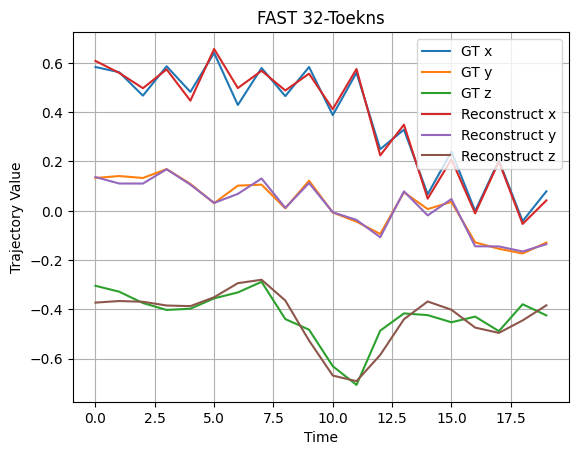

In [ ]:
import os
import sys

# Set all cache directories before any HF imports
cache_dir = "/srv/rl2-lab/flash7/zhenyang/.cache"
os.environ["TRANSFORMERS_CACHE"] = cache_dir
os.environ["HF_HOME"] = cache_dir
os.environ["HF_DATASETS_CACHE"] = cache_dir
os.environ["XDG_CACHE_HOME"] = cache_dir

# Clear any existing HF modules from sys.modules
for module in list(sys.modules.keys()):
    if module.startswith("transformers") or module.startswith("huggingface"):
        del sys.modules[module]

import matplotlib.pyplot as plt
import numpy as np
from transformers import AutoProcessor

# Load the tokenizer from the Hugging Face hub
tokenizer = AutoProcessor.from_pretrained("physical-intelligence/fast", trust_remote_code=True, local_files_only=True)

# Tokenize & decode action chunks (we use dummy data here)
# action_data = np.random.rand(1, 20, 14)    # one batch of action chunks
# action_data = action_data_norm[np.newaxis, :, :]
action_data = test_action_norm[np.newaxis, :, :]
tokens = tokenizer(action_data)  # tokens = list[list[int]]
print(f"[test action norm] tokens number: {len(tokens[0])}")
print(f"[test action norm] tokens are: {tokens}")
decoded_actions = tokenizer.decode(tokens)
decoded_actions = denormalize_action_percentile(decoded_actions, action_min, action_max)
print(f"[test action norm] decoded actions are: {decoded_actions.shape}")

##### Test cut-off tokens #####
# tokens_short = tokens[0][:len(tokens[0])-3]
tokens_short = tokens[0][:-2]
tokens_short = [tokens_short]  # list[list[int]]
# print(f"[test action norm short] tokens short {len(tokens_short[0])}")
decoded_actions_short = tokenizer.decode(tokens_short)
decoded_actions_short = denormalize_action_percentile(decoded_actions_short, action_min, action_max)
print(
    f"[test action norm short] tokens short {len(tokens_short)} decoded short action shape {decoded_actions_short.shape}"
)
# print(np.mean(np.abs(decoded_actions[0] - action_data[0]), axis=0))

action_denorm = denormalize_action_percentile(action_data, action_min, action_max)  # [1, 20, 7]
x = action_denorm[..., 0][0]
y = action_denorm[..., 1][0]
z = action_denorm[..., 2][0]

x_rec = decoded_actions[..., 0][0]
y_rec = decoded_actions[..., 1][0]
z_rec = decoded_actions[..., 2][0]

x_rec_short = decoded_actions_short[..., 0][0]
y_rec_short = decoded_actions_short[..., 1][0]
z_rec_short = decoded_actions_short[..., 2][0]

horizon_short = min(action_denorm.shape[0], decoded_actions_short.shape[0])
print(f"x_rec_short: {x_rec_short.shape}, y_rec_short: {y_rec_short.shape}, z_rec_short: {z_rec_short.shape}")
print(f"x_rec: {x_rec.shape}, y_rec: {y_rec.shape}, z_rec: {z_rec.shape}")
print(f"x: {x.shape}, y: {y.shape}, z: {z.shape}")
print(f"error between x_rec and x_rec_short: {np.mean(np.abs(x_rec[:horizon_short] - x_rec_short[:horizon_short]))}")

#### Plot 3D trajectory ####
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# ax.plot(x, y, z, color="black", label="GT traj")
# ax.plot(x_rec, y_rec, z_rec, color="red", label="LDS-Tokenizer")
# ax.plot(x_rec_short, y_rec_short, z_rec_short, color="blue", label="LDS-Tokenizer (short)")


#### Plot 2D trajectory ####
def plot_xyz_trajectory(time, x, y, z, ax, title="3D Trajectory", label="GT", xlabel="Time", ylabel="Value"):
    """
    Plot x, y, z trajectories over time in the same figure.

    Parameters:
    - time: array-like, time points
    - x: array-like, x trajectory values
    - y: array-like, y trajectory values
    - z: array-like, z trajectory values
    - title: str, title of the plot
    - xlabel: str, label for the x-axis
    - ylabel: str, label for the y-axis
    """
    ax.plot(time, x, label=f"{label} x")
    ax.plot(time, y, label=f"{label} y")
    ax.plot(time, z, label=f"{label} z")

    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend()
    ax.grid()


# 2D plot
fig, ax = plt.subplots()
time = np.arange(len(x))  # Assuming time points are sequential integers
plot_xyz_trajectory(time, x, y, z, ax, title="GT Trajectory", label="GT", xlabel="Time", ylabel="Trajectory Value")
plot_xyz_trajectory(
    time, x_rec, y_rec, z_rec, ax, title="FAST 32-Toekns", label="Reconstruct", xlabel="Time", ylabel="Trajectory Value"
)
# plot_xyz_trajectory(np.arange(len(x_rec_short)), x_rec_short, y_rec_short, z_rec_short, ax, title="FAST 30-Toekns", label="Reconstruct", xlabel="Time", ylabel="Trajectory Value")

plt.grid()
plt.show()

In [17]:
print(x_rec_short)
print(decoded_actions_short.shape)
# print(decoded_actions_short)
print(f"min {action_min}, max {action_max}")

print(f"tokens: {tokens}")

[ 0.63616813  0.55519152  0.55533137  0.53923252  0.53705567  0.62983693
  0.5496651   0.53581854  0.5754225   0.45854704  0.5701258   0.36389406
  0.32087224  0.15215269  0.16453149  0.05327133  0.16503845 -0.00490176
  0.03589388]
(1, 19, 7)
min [-0.2737     -0.28535    -0.84435    -0.05623891 -0.08138361 -0.17549368
 -1.        ], max [0.79635    0.36035    1.         0.05584696 0.16937013 0.25508889
 1.        ]
tokens: [[389, 371, 308, 339, 319, 303, 545, 294, 444, 776, 311, 1558, 273, 386, 1831, 829, 324, 677, 273, 695, 286, 333, 392, 454, 413, 1216, 381, 1502, 258, 1136, 258, 256]]


## Test FAST with less tokens
What if we remove some tokens? Can we still reconstruct the trajectory good enough?


*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
error dict: {'x': [np.float64(0.024760235443839318), np.float64(0.053168128614735966), np.float64(0.053168128614735966), np.float64(0.07498277911827678), np.float64(0.07498277911827678), np.float64(0.10170971007815244), np.float64(0.18371902578307886), np.float64(0.2616456894978155), np.float64(0.307423525587

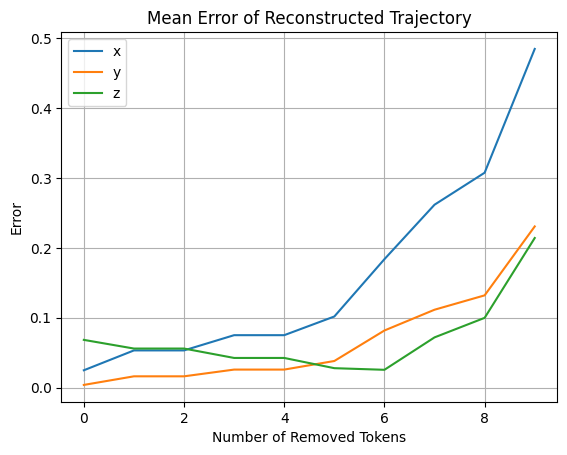

In [6]:
def reduce_token_error(tokens, tokenizer, reduced_token_number, action_denorm, action_min, action_max):
    """
    Calculate the reconstruction error for x, y, z trajectories by reducing the number of tokens.

    This function evaluates how the reconstruction error changes as tokens are progressively removed
    from the end of the token list. It decodes the tokens, denormalizes the actions, and computes
    the mean absolute error for each trajectory component (x, y, z) compared to the original data.

    Parameters:
    - tokens: list, the initial set of tokens representing an action chunk.
    - tokenizer: object, used to decode the tokens back into actions.
    - reduced_token_number: int, the number of tokens to reduce (not directly used in the function).
    - action_denorm: array-like, the original denormalized actions for comparison.
    - action_min: float, the minimum value used for denormalization.
    - action_max: float, the maximum value used for denormalization.

    Returns:
    - error_dict: dict, containing mean absolute errors for x, y, and z trajectories.
    """

    token_list = []

    # Start with the full token set and progressively remove tokens from the end
    token_list.append(tokens)
    for i in range(1, reduced_token_number):
        token_list.append([tokens[0][:-i]])

    # print(f"token_list: {token_list}")
    # print(f"action denorm: {action_denorm}")

    error_dict = {"x": [], "y": [], "z": []}
    for token in token_list:
        # print(f"token number: {len(token[0])}")
        decoded_actions_short = tokenizer.decode(token)
        decoded_actions_short = denormalize_action_percentile(decoded_actions_short, action_min, action_max)
        horizon_short = min(action_denorm.shape[0], decoded_actions_short.shape[0])

        # Calculate mean absolute error for each trajectory component
        error_dict["x"].append(np.mean(np.abs(decoded_actions_short[0, :horizon_short, 0] - x[:horizon_short])))
        error_dict["y"].append(np.mean(np.abs(decoded_actions_short[0, :horizon_short, 1] - y[:horizon_short])))
        error_dict["z"].append(np.mean(np.abs(decoded_actions_short[0, :horizon_short, 2] - z[:horizon_short])))

    return error_dict


error_dict = reduce_token_error(tokens, tokenizer, 10, action_denorm, action_min, action_max)

print(f"error dict: {error_dict}")

plt.plot(error_dict["x"], label="x")
plt.plot(error_dict["y"], label="y")
plt.plot(error_dict["z"], label="z")
plt.xlabel("Number of Removed Tokens")
plt.ylabel("Error")
plt.title("Mean Error of Reconstructed Trajectory")
plt.legend()
plt.grid()
plt.show()

## Getting error for all action chunks
Get errors for all action chunks.

action_data_array.shape: (9666, 7)
################### action_tokens: 36 ###################
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
*********************** decode function test ***********************
################### action_tokens: 31 ###################
*********************

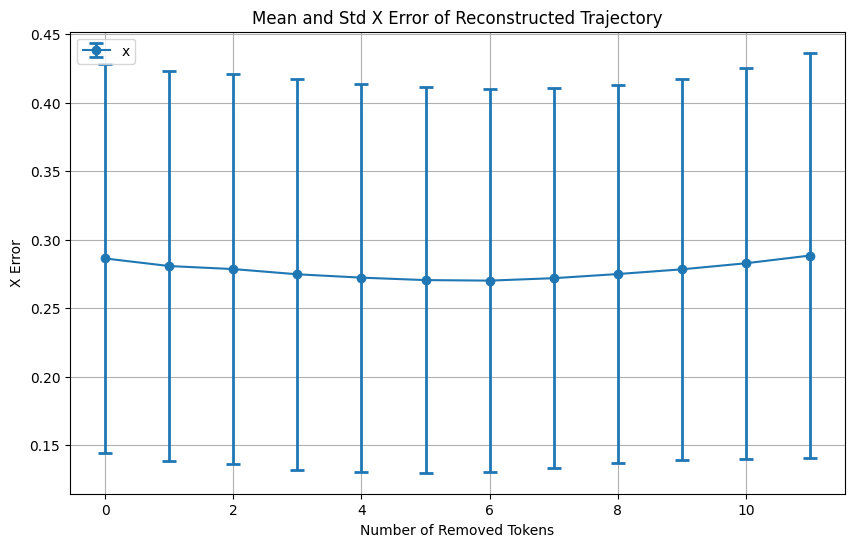

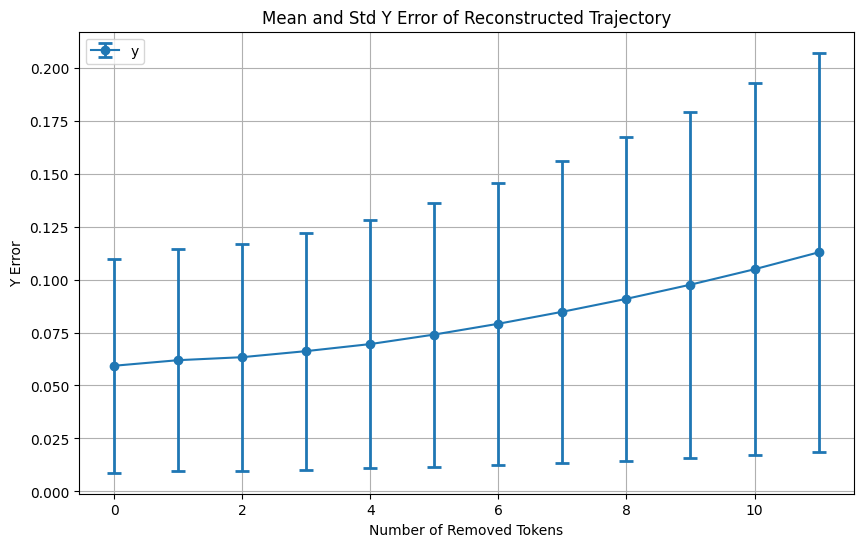

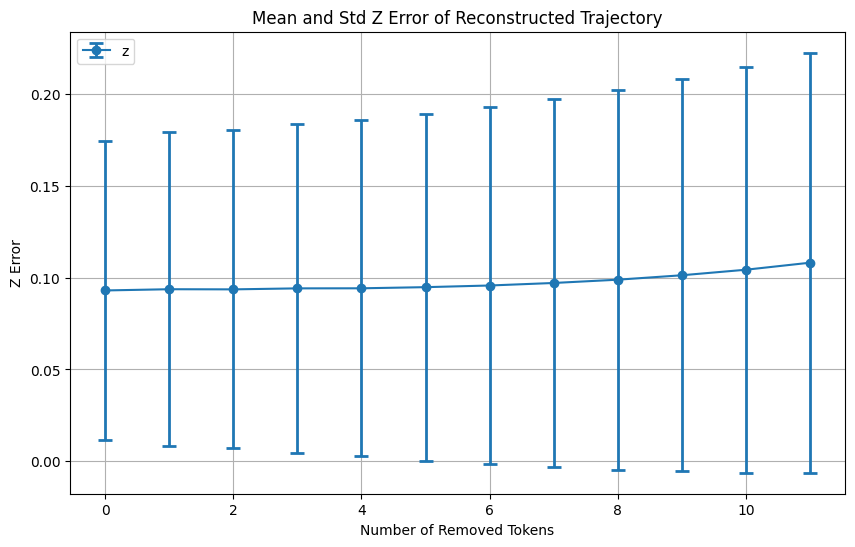

In [15]:
## Not sure it is good to simply select all action chunks from the array

horizon = 20
reduced_token_number = 12
all_error_dict = {"x": [], "y": [], "z": []}
print(f"action_data_array.shape: {action_data_array.shape}")
token_number_list = []
for i in range(action_data_array.shape[0] - horizon):
    action_chunk = action_data_array[i : i + horizon, :]
    action_chunk_norm = action_norm[i : i + horizon, :]
    action_chunk_norm = action_chunk_norm[np.newaxis, :, :]
    action_tokens = tokenizer(action_chunk_norm)
    print(f"################### action_tokens: {len(action_tokens[0])} ###################")
    token_number_list.append(len(action_tokens[0]))
    error_dict = reduce_token_error(
        action_tokens, tokenizer, reduced_token_number, action_chunk, action_min, action_max
    )

    all_error_dict["x"].append(error_dict["x"])
    all_error_dict["y"].append(error_dict["y"])
    all_error_dict["z"].append(error_dict["z"])

x_all_error = np.array(all_error_dict["x"])
y_all_error = np.array(all_error_dict["y"])
z_all_error = np.array(all_error_dict["z"])

import matplotlib.pyplot as plt

# Calculate mean and std for each reduced horizon number
mean_x_error = np.mean(x_all_error, axis=0)
std_x_error = np.std(x_all_error, axis=0)
mean_y_error = np.mean(y_all_error, axis=0)
std_y_error = np.std(y_all_error, axis=0)
mean_z_error = np.mean(z_all_error, axis=0)
std_z_error = np.std(z_all_error, axis=0)

# Print the mean and std of x, y, z error respectively
print(f"Mean X Error: {mean_x_error}")
print(f"Std X Error: {std_x_error}")
print(f"Mean Y Error: {mean_y_error}")
print(f"Std Y Error: {std_y_error}")
print(f"Mean Z Error: {mean_z_error}")
print(f"Std Z Error: {std_z_error}")

# Plot the mean and std of x, y, z error in a bell shape plot
import matplotlib.pyplot as plt

# Plot x error
plt.figure(figsize=(10, 6))
plt.errorbar(
    range(len(mean_x_error)), mean_x_error, yerr=std_x_error, label="x", fmt="-o", capsize=5, elinewidth=2, capthick=2
)
plt.xlabel("Number of Removed Tokens")
plt.ylabel("X Error")
plt.title("Mean and Std X Error of Reconstructed Trajectory")
plt.legend()
plt.grid()
plt.show()

# Plot y error
plt.figure(figsize=(10, 6))
plt.errorbar(
    range(len(mean_y_error)), mean_y_error, yerr=std_y_error, label="y", fmt="-o", capsize=5, elinewidth=2, capthick=2
)
plt.xlabel("Number of Removed Tokens")
plt.ylabel("Y Error")
plt.title("Mean and Std Y Error of Reconstructed Trajectory")
plt.legend()
plt.grid()
plt.show()

# Plot z error
plt.figure(figsize=(10, 6))
plt.errorbar(
    range(len(mean_z_error)), mean_z_error, yerr=std_z_error, label="z", fmt="-o", capsize=5, elinewidth=2, capthick=2
)
plt.xlabel("Number of Removed Tokens")
plt.ylabel("Z Error")
plt.title("Mean and Std Z Error of Reconstructed Trajectory")
plt.legend()
plt.grid()
plt.show()

action denorm [[[ 0.583       0.133      -0.304      -0.00707744  0.0533347
   -0.1151401  -1.        ]
  [ 0.562       0.141      -0.328      -0.00830057  0.04571144
   -0.11356513 -1.        ]
  [ 0.467       0.133      -0.374      -0.00650519  0.03586603
   -0.11136833 -1.        ]
  [ 0.586       0.169      -0.402      -0.00955024  0.02298542
   -0.10976872 -1.        ]
  [ 0.482       0.109      -0.397      -0.00636572  0.01369819
   -0.10851178 -1.        ]
  [ 0.64        0.031      -0.355      -0.00377719  0.00287282
   -0.1041653  -1.        ]
  [ 0.429       0.102      -0.331      -0.00463862 -0.00121351
   -0.10389936 -1.        ]
  [ 0.579       0.106      -0.288      -0.01273312  0.00115893
   -0.108259   -1.        ]
  [ 0.465       0.01       -0.439      -0.03175684  0.00230393
   -0.11155407 -1.        ]
  [ 0.583       0.122      -0.482      -0.03885184 -0.00154439
   -0.11769435 -1.        ]
  [ 0.388      -0.007      -0.63       -0.03846749 -0.00966473
   -0.11956938

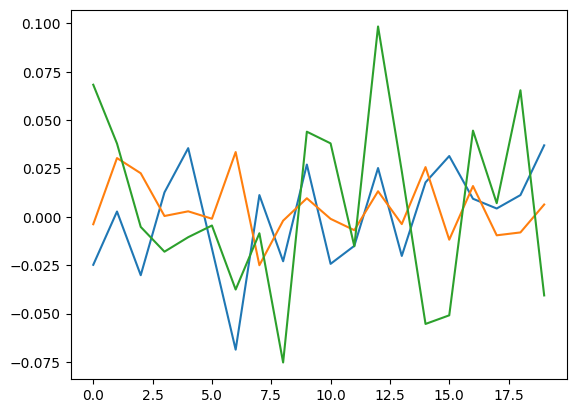

In [31]:
print("action denorm", action_denorm)
print(f"x is {x}")

print(f"gt action  {action_denorm[0][:5, :]}")
print(f"decoded action {decoded_actions[0][:5, :]}")

print("test:", x - decoded_actions[0][:, 0])
error = action_denorm[0] - decoded_actions[0]
print(
    f"all shape action denorm: {action_denorm.shape}, decoded_actions: {decoded_actions.shape}, error shape: {error.shape}"
)
print(f"avr error: {np.mean(np.abs(error), axis=0)}")
print(f"error dict: {error_dict}")
plt.plot(error[:, :3])
plt.show()

## Test from FAST code

Using action = [20x7] as example, we will have DCT coeff = [20x7]
Then we will have bytes = [20x7]. (in this level we can compete, we are using less with LDS-Tokenizer)
After BPE, we will have tokens ~= 29

In [3]:
from scipy.fft import dct

scale = 10
min_token = 0

dct_coeff = dct(test_seq, axis=1, norm="ortho")
print(dct_coeff)
dct_coeff = np.around(dct_coeff * scale)  # to get integer to change to str
print(dct_coeff)

tokens = []
tokens_str = []
for elem in dct_coeff:
    token_str = "".join(map(chr, np.maximum(elem.flatten() - min_token, 0).astype(int)))
    tokens_str.append(token_str)
    # tokens.append(tokenizer(token_str)["input_ids"])

print(len(tokens_str))
print(tokens_str)

#     tokens.append(self.bpe_tokenizer(token_str)["input_ids"])
# return tokens

[[-0.31503296  0.48069772 -0.53129802  0.49849832 -0.35583117  0.17752921
  -0.05443225]
 [-0.23973001  0.6131237  -0.39658417  0.59347916 -0.31512271  0.14862685
  -0.09567333]
 [-0.18596946  0.70090303 -0.333525    0.62560977 -0.28775217  0.15004443
  -0.09827865]
 [-0.14492362  0.80281791 -0.2051036   0.73143427 -0.24616738  0.09254751
  -0.15897207]
 [-0.17404397  0.81578098 -0.1645989   0.74549509 -0.27890196 -0.01797064
  -0.24801259]
 [-0.12795762  0.89315733 -0.11117311  0.77845125 -0.22039001  0.04629696
  -0.1946125 ]
 [-0.14890924  0.89175473 -0.10937913  0.77193516 -0.21604039  0.03100741
  -0.2063374 ]
 [-0.10402766  0.97515743 -0.05484441  0.77859645 -0.20955788  0.02778784
  -0.20539021]
 [-0.1287251   0.96549491 -0.08083187  0.73672818 -0.23031405 -0.00656719
  -0.21995692]
 [-0.16858572  0.91921658 -0.11151795  0.74541254 -0.16700829  0.07314696
  -0.16323968]
 [-0.24827838  0.84576045 -0.11137584  0.79021177 -0.12154273  0.08848684
  -0.17248553]
 [-0.2650114   0.8337

## Parameters space analysis
1. How many tokens to represent the action chunk?
2. What kind of characteristic of parameters we have?

In [3]:
import torch


def make_att_2d_masks(pad_masks, att_masks):
    """Copied from big_vision.

    Tokens can attend to valid inputs tokens which have a cumulative mask_ar
    smaller or equal to theirs. This way `mask_ar` int[B, N] can be used to
    setup several types of attention, for example:

      [[1 1 1 1 1 1]]: pure causal attention.

      [[0 0 0 1 1 1]]: prefix-lm attention. The first 3 tokens can attend between
          themselves and the last 3 tokens have a causal attention. The first
          entry could also be a 1 without changing behaviour.

      [[1 0 1 0 1 0 0 1 0 0]]: causal attention between 4 blocks. Tokens of a
          block can attend all previous blocks and all tokens on the same block.

    Args:
      input_mask: bool[B, N] true if its part of the input, false if padding.
      mask_ar: int32[B, N] mask that's 1 where previous tokens cannot depend on
        it and 0 where it shares the same attention mask as the previous token.
    """
    if att_masks.ndim != 2:
        raise ValueError(att_masks.ndim)
    if pad_masks.ndim != 2:
        raise ValueError(pad_masks.ndim)

    cumsum = torch.cumsum(att_masks, dim=1)
    att_2d_masks = cumsum[:, None, :] <= cumsum[:, :, None]
    pad_2d_masks = pad_masks[:, None, :] * pad_masks[:, :, None]
    att_2d_masks = att_2d_masks & pad_2d_masks
    return att_2d_masks


att_mask = torch.tensor([[1, 1, 1, 1, 1, 1], [0, 0, 0, 1, 1, 1]])
pad_mask = torch.tensor([[1, 1, 1, 0, 0, 0], [1, 1, 1, 0, 0, 0]])

masks = make_att_2d_masks(pad_mask, att_mask)

print(masks)

tensor([[[1, 0, 0, 0, 0, 0],
         [1, 1, 0, 0, 0, 0],
         [1, 1, 1, 0, 0, 0],
         [0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0]],

        [[1, 1, 1, 0, 0, 0],
         [1, 1, 1, 0, 0, 0],
         [1, 1, 1, 0, 0, 0],
         [0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0]]])
